In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 200
beta = torch.linspace(0.04, 0.04, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0003, device='cuda:0')

In [3]:
alpha_

tensor([9.6000e-01, 9.2160e-01, 8.8474e-01, 8.4935e-01, 8.1537e-01, 7.8276e-01,
        7.5145e-01, 7.2139e-01, 6.9253e-01, 6.6483e-01, 6.3824e-01, 6.1271e-01,
        5.8820e-01, 5.6467e-01, 5.4209e-01, 5.2040e-01, 4.9959e-01, 4.7960e-01,
        4.6042e-01, 4.4200e-01, 4.2432e-01, 4.0735e-01, 3.9106e-01, 3.7541e-01,
        3.6040e-01, 3.4598e-01, 3.3214e-01, 3.1886e-01, 3.0610e-01, 2.9386e-01,
        2.8210e-01, 2.7082e-01, 2.5999e-01, 2.4959e-01, 2.3960e-01, 2.3002e-01,
        2.2082e-01, 2.1199e-01, 2.0351e-01, 1.9537e-01, 1.8755e-01, 1.8005e-01,
        1.7285e-01, 1.6593e-01, 1.5930e-01, 1.5292e-01, 1.4681e-01, 1.4094e-01,
        1.3530e-01, 1.2989e-01, 1.2469e-01, 1.1970e-01, 1.1491e-01, 1.1032e-01,
        1.0591e-01, 1.0167e-01, 9.7602e-02, 9.3698e-02, 8.9950e-02, 8.6352e-02,
        8.2898e-02, 7.9582e-02, 7.6399e-02, 7.3343e-02, 7.0409e-02, 6.7593e-02,
        6.4889e-02, 6.2294e-02, 5.9802e-02, 5.7410e-02, 5.5113e-02, 5.2909e-02,
        5.0793e-02, 4.8761e-02, 4.6810e-

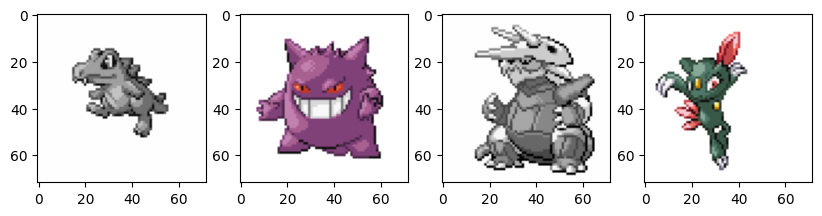

In [4]:
transform = v2.Compose([
    v2.Pad(6, 1.0),
    v2.RandomCrop((64+6, 64+6)),
    v2.Pad(1, 1.0),
    v2.RandomApply([v2.ColorJitter()], 0.2),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.2),
    v2.RandomGrayscale(p = 0.2),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([transform(x) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)

In [6]:
model = UNet_conditional(3, 3, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3

    x = torch.randn((N, 3, 72, 72), device=device)

    ty = [["Grass"], ["Fire"], ["Water"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    
    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])
    
    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|          | 0/100001 [00:00<?, ?it/s]

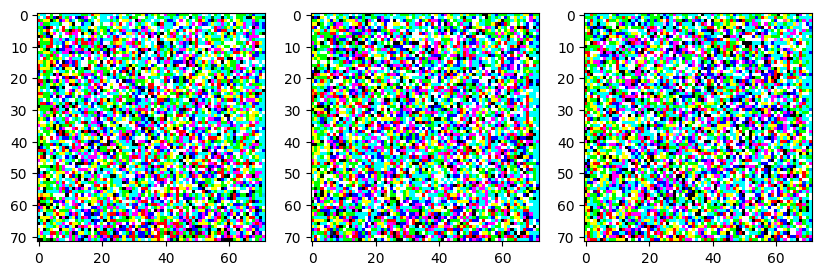

0.02435409:   1%|          | 997/100001 [00:33<51:40, 31.93it/s] 

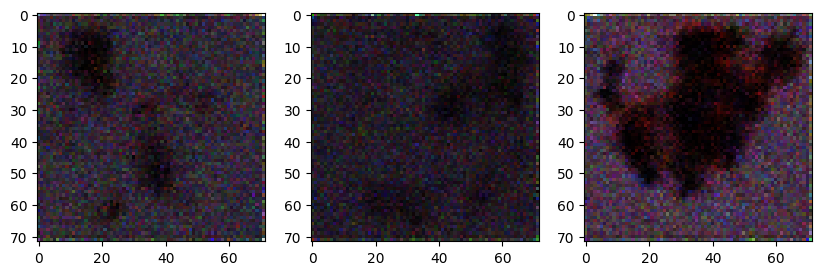

0.02702229:   2%|▏         | 1997/100001 [01:05<51:11, 31.91it/s]  

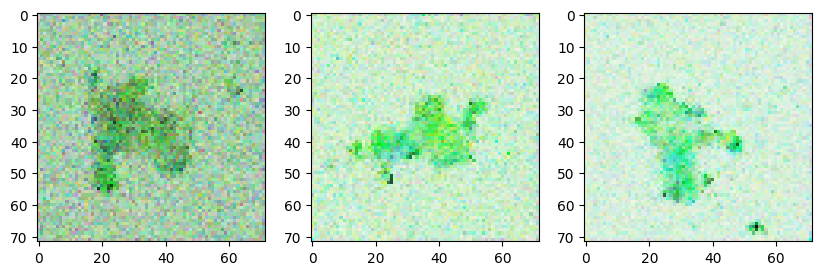

0.01941773:   3%|▎         | 2997/100001 [01:38<50:52, 31.77it/s]  

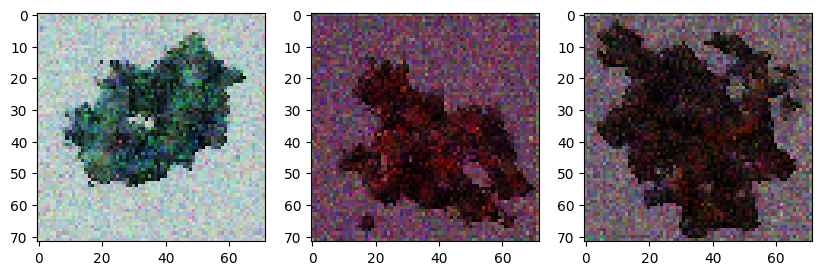

0.02179684:   4%|▍         | 3997/100001 [02:11<50:13, 31.86it/s]  

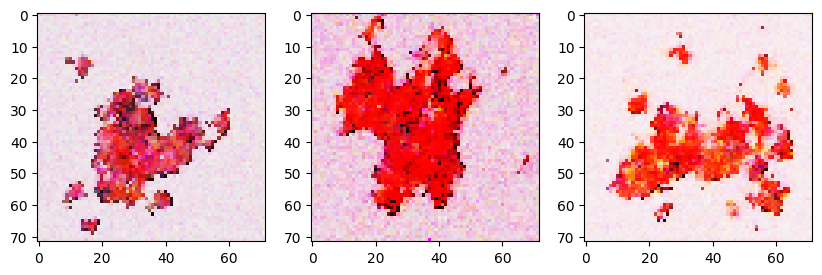

0.02672454:   5%|▍         | 4997/100001 [02:44<49:31, 31.97it/s]  

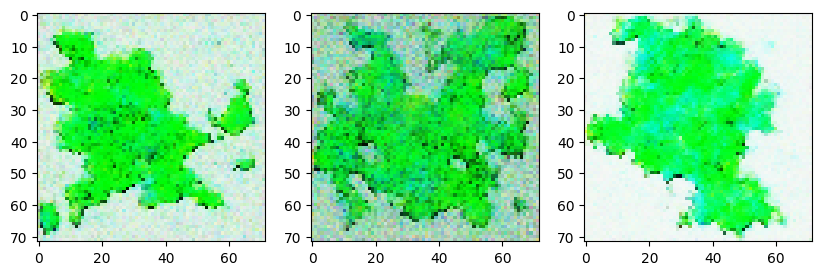

0.01456954:   6%|▌         | 5997/100001 [03:16<49:07, 31.89it/s]  

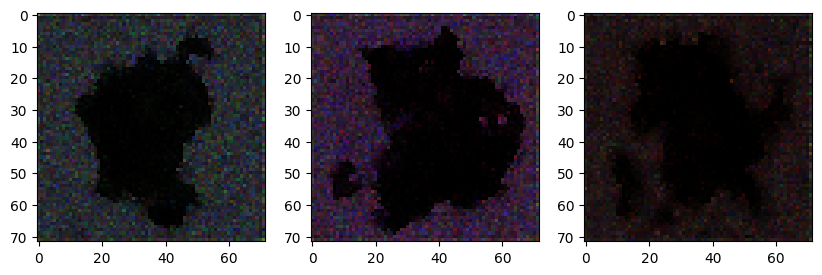

0.01455639:   7%|▋         | 6997/100001 [03:49<48:20, 32.07it/s]  

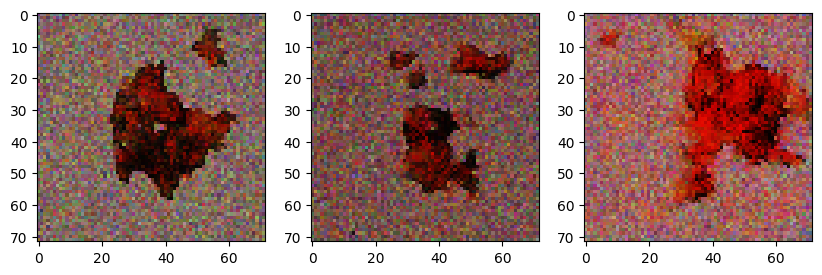

0.01644182:   8%|▊         | 7997/100001 [04:22<48:12, 31.81it/s]  

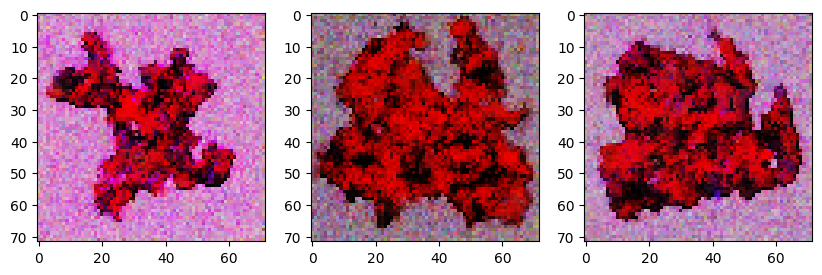

0.01873494:   9%|▉         | 8997/100001 [04:55<47:37, 31.85it/s]  

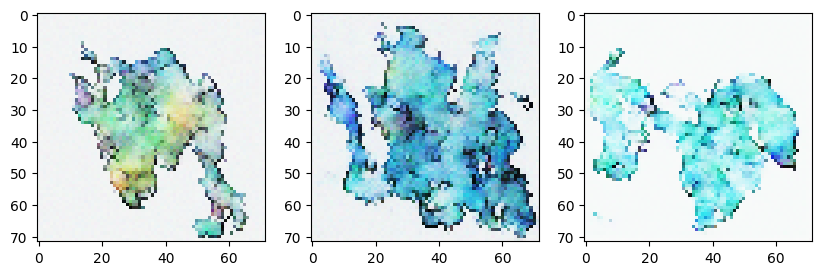

0.03830227:  10%|▉         | 9997/100001 [05:28<47:00, 31.91it/s]  

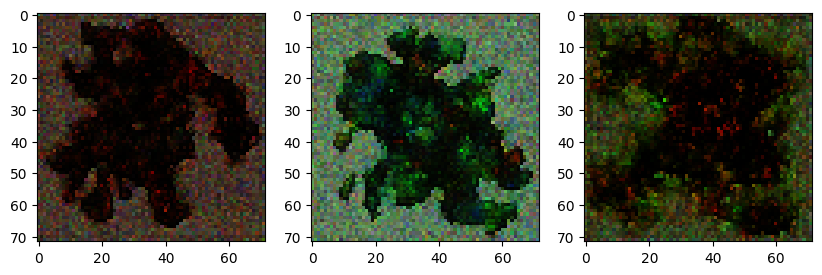

0.02544135:  11%|█         | 10997/100001 [06:00<46:35, 31.84it/s]  

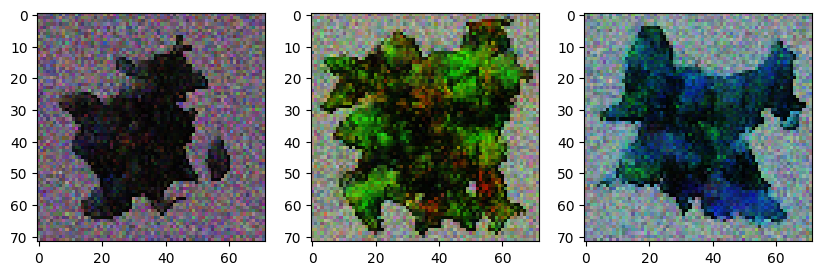

0.01938533:  12%|█▏        | 11997/100001 [06:33<46:02, 31.85it/s]  

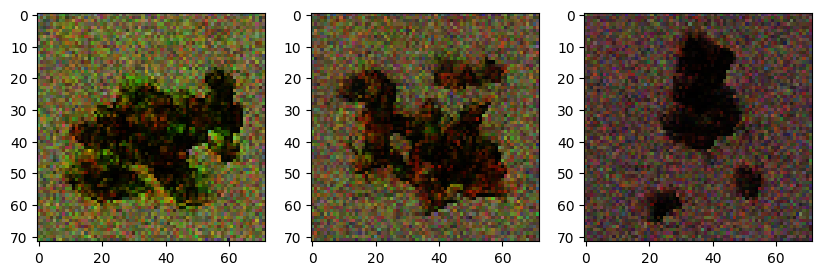

0.03874454:  13%|█▎        | 12997/100001 [07:06<45:29, 31.87it/s]  

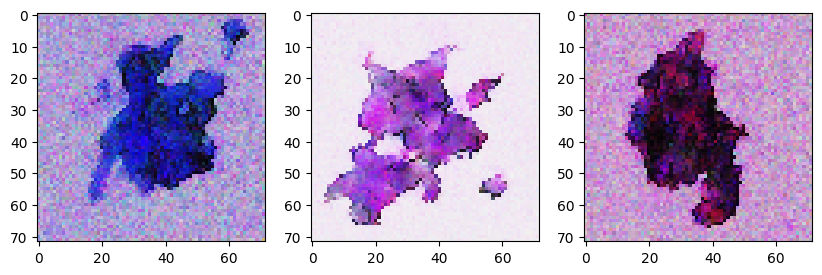

0.01865491:  14%|█▍        | 13997/100001 [07:39<44:57, 31.88it/s]  

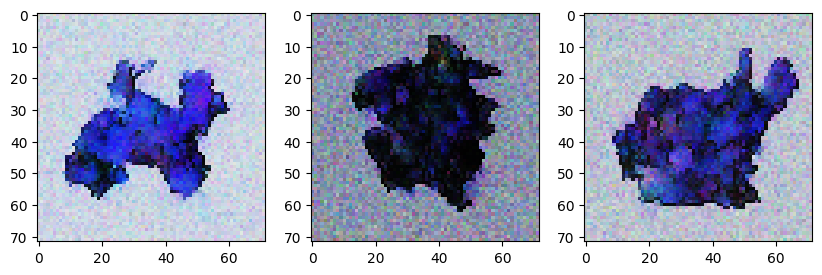

0.02157756:  15%|█▍        | 14997/100001 [08:11<44:28, 31.86it/s]  

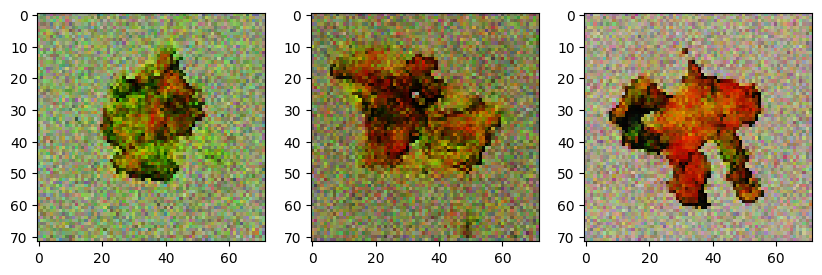

0.02100345:  16%|█▌        | 15997/100001 [08:44<44:06, 31.75it/s]  

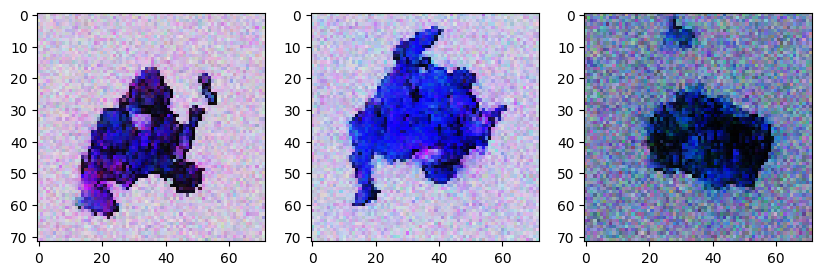

0.01720224:  17%|█▋        | 16997/100001 [09:17<43:24, 31.87it/s]  

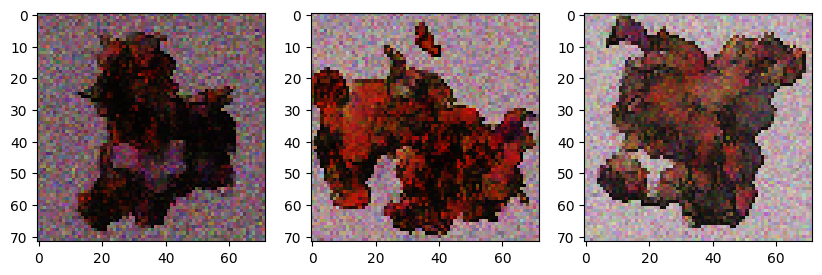

0.01781897:  18%|█▊        | 17997/100001 [09:50<42:51, 31.88it/s]  

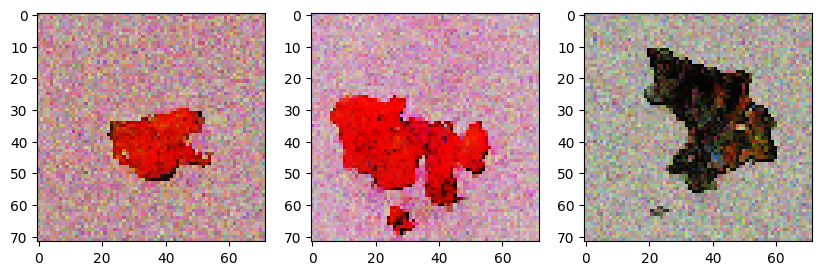

0.02394891:  19%|█▉        | 18997/100001 [10:23<42:23, 31.85it/s]  

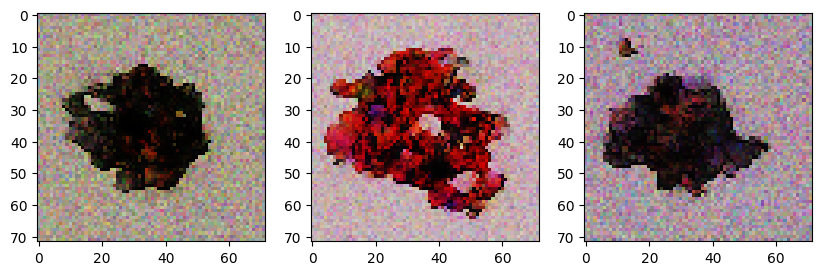

0.01884400:  20%|█▉        | 19997/100001 [10:55<41:45, 31.93it/s]  

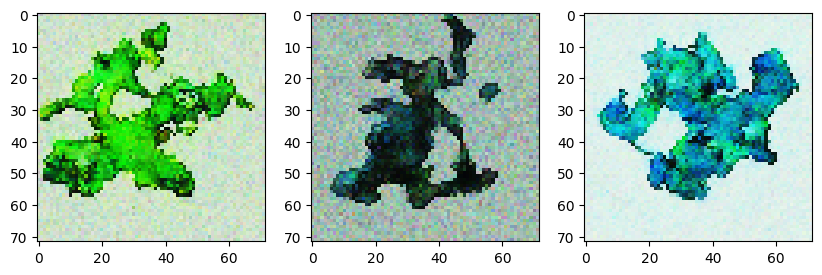

0.01487929:  21%|██        | 20997/100001 [11:28<41:17, 31.89it/s]  

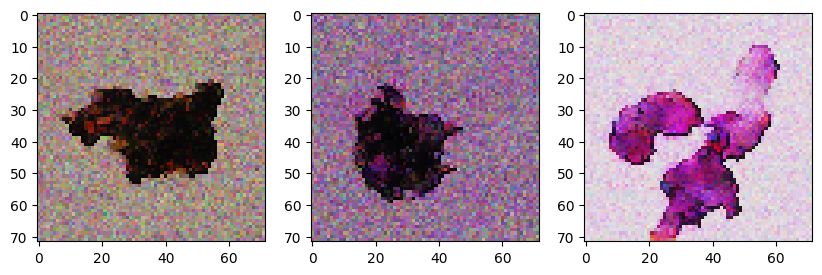

0.02837992:  22%|██▏       | 21997/100001 [12:01<40:48, 31.85it/s]  

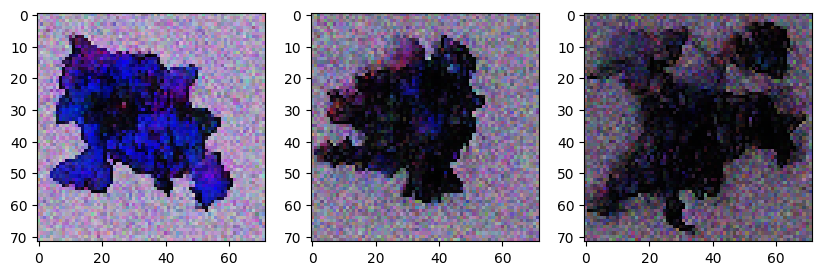

0.02554645:  23%|██▎       | 22997/100001 [12:34<40:15, 31.88it/s]  

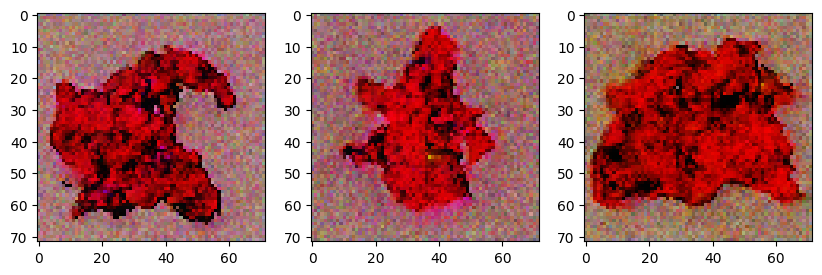

0.01040385:  24%|██▍       | 23997/100001 [13:06<39:44, 31.87it/s]  

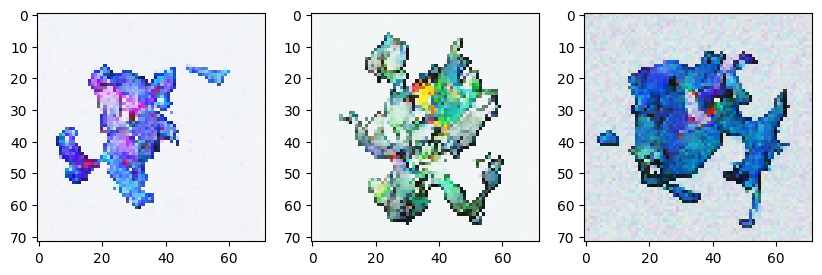

0.01525649:  25%|██▍       | 24997/100001 [13:39<39:15, 31.85it/s]  

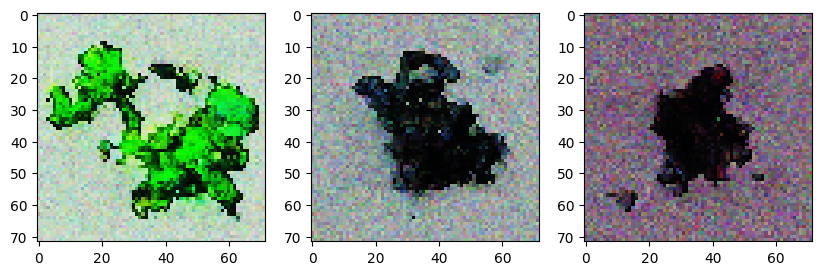

0.02849680:  26%|██▌       | 25997/100001 [14:12<38:39, 31.91it/s]  

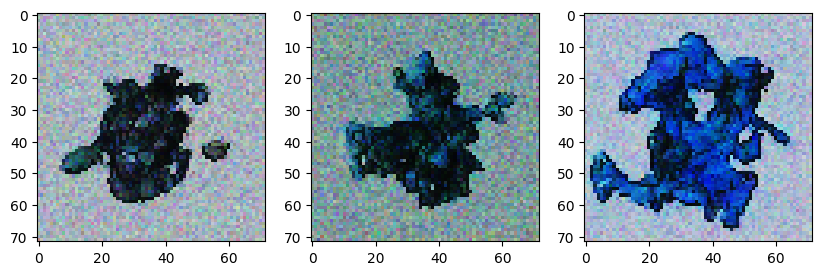

0.01814578:  27%|██▋       | 26997/100001 [14:45<38:08, 31.89it/s]  

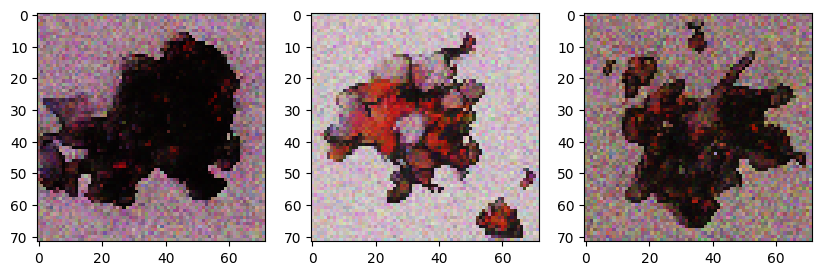

0.01022809:  28%|██▊       | 27997/100001 [15:18<37:34, 31.94it/s]  

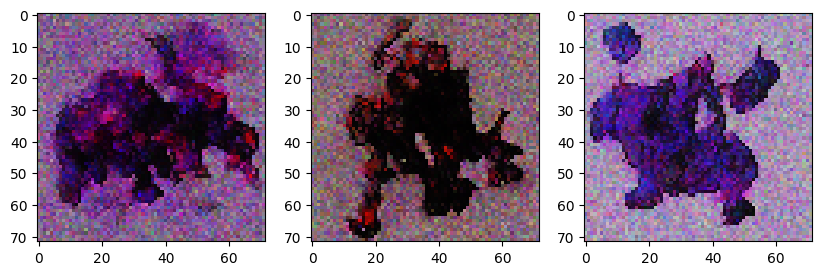

0.02618267:  29%|██▉       | 28997/100001 [15:50<37:11, 31.81it/s]  

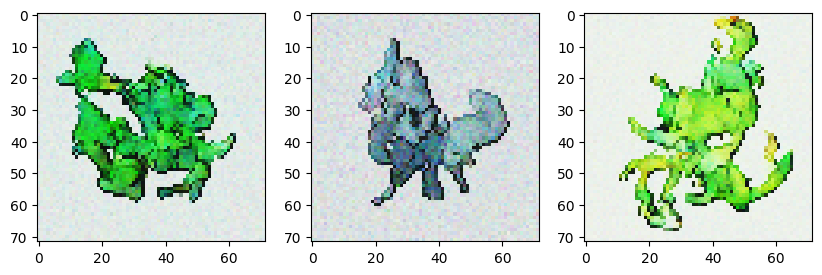

0.01961690:  30%|██▉       | 29997/100001 [16:23<36:43, 31.77it/s]  

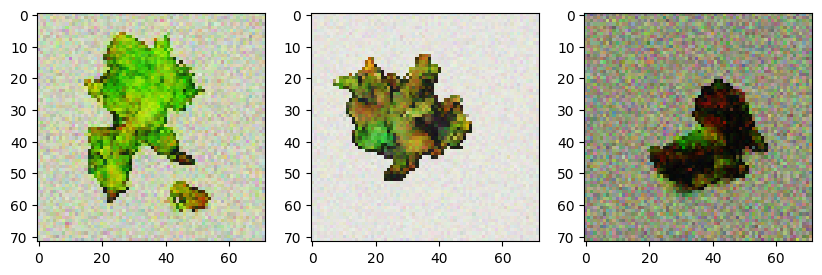

0.01778279:  31%|███       | 30997/100001 [16:56<36:07, 31.83it/s]  

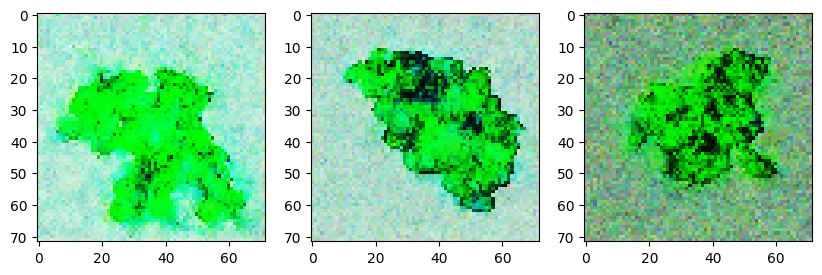

0.02073634:  32%|███▏      | 31997/100001 [17:29<35:32, 31.89it/s]  

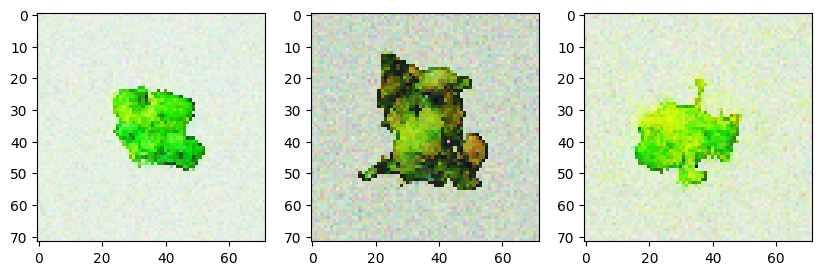

0.02524708:  33%|███▎      | 32997/100001 [18:01<35:05, 31.82it/s]  

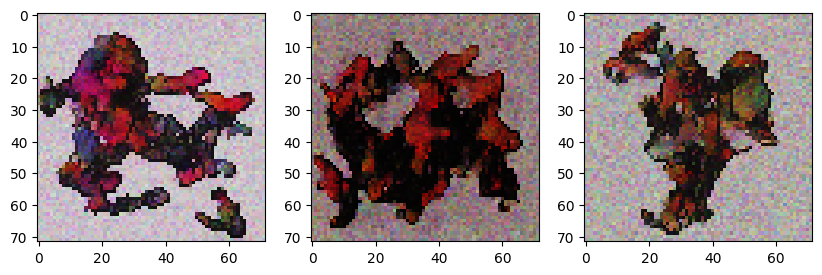

0.02771300:  34%|███▍      | 33997/100001 [18:34<34:32, 31.84it/s]  

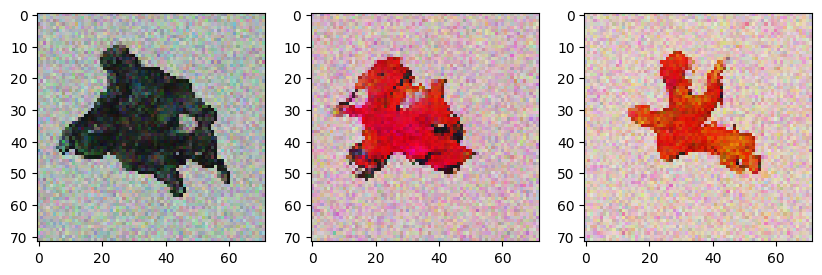

0.01502048:  35%|███▍      | 34997/100001 [19:07<33:56, 31.92it/s]  

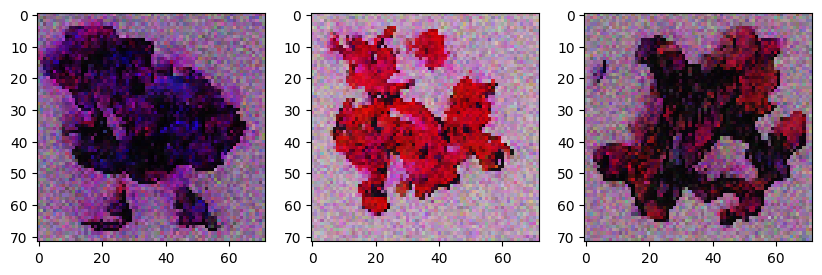

0.00814578:  36%|███▌      | 35997/100001 [19:40<33:31, 31.82it/s]  

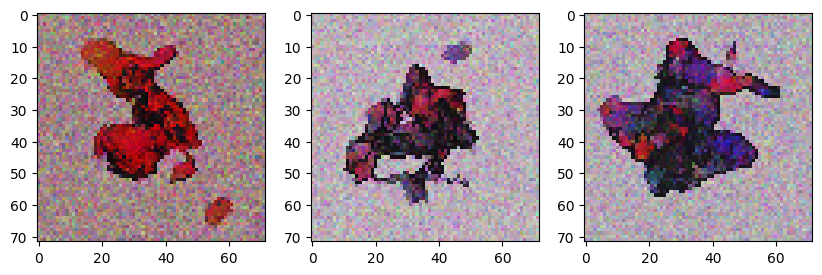

0.01285656:  37%|███▋      | 36997/100001 [20:13<33:00, 31.81it/s]  

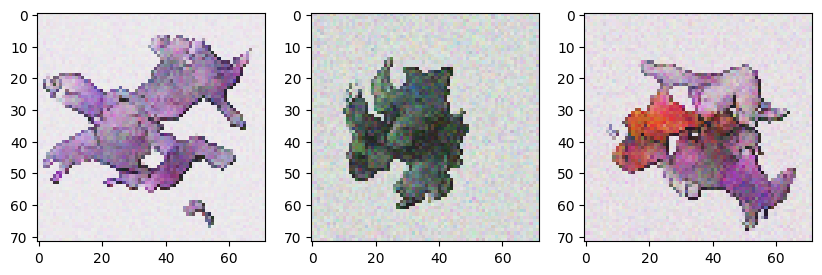

0.02103312:  38%|███▊      | 37997/100001 [20:45<32:26, 31.85it/s]  

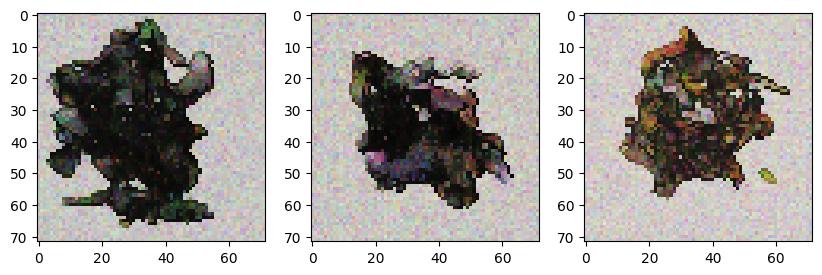

0.03041921:  39%|███▉      | 38997/100001 [21:18<31:57, 31.82it/s]  

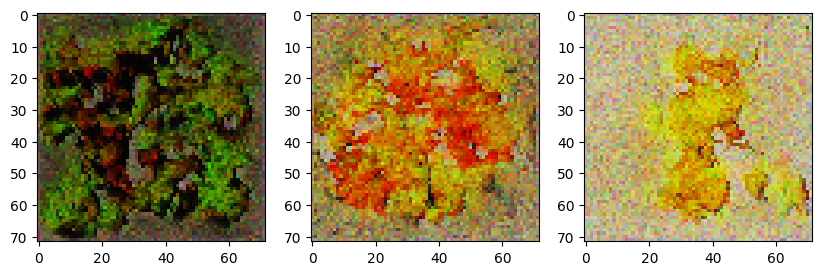

0.03372546:  40%|███▉      | 39997/100001 [21:51<31:24, 31.83it/s]  

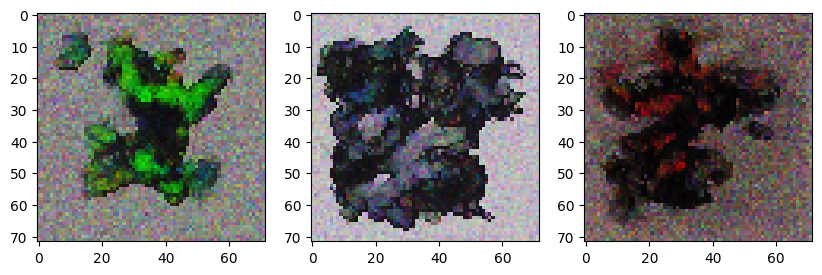

0.03222131:  41%|████      | 40997/100001 [22:24<30:56, 31.78it/s]  

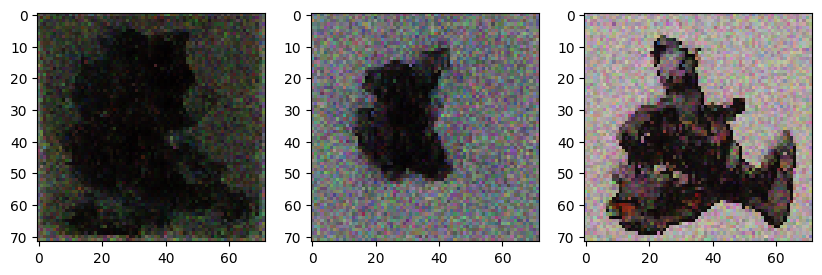

0.03240138:  42%|████▏     | 41997/100001 [22:57<30:21, 31.85it/s]  

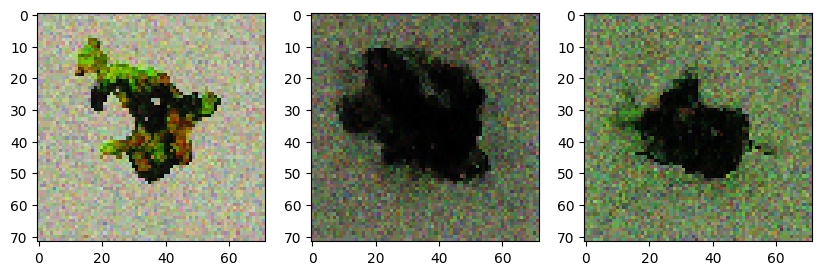

0.01305711:  43%|████▎     | 42997/100001 [23:29<29:52, 31.80it/s]  

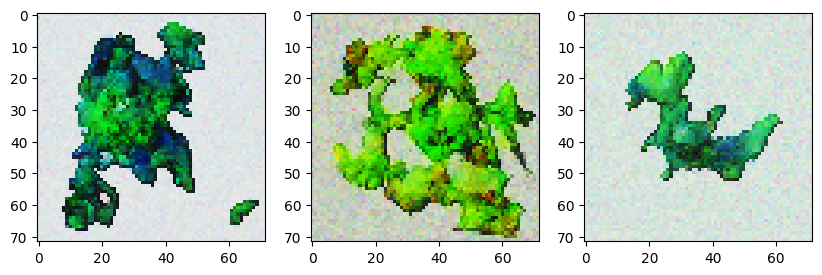

0.01569075:  44%|████▍     | 43997/100001 [24:02<29:15, 31.91it/s]  

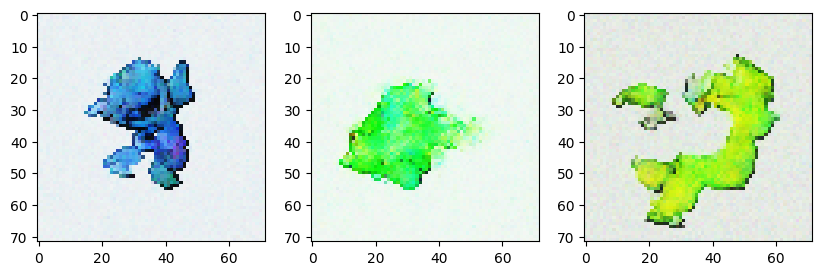

0.01486929:  45%|████▍     | 44997/100001 [24:35<28:45, 31.88it/s]  

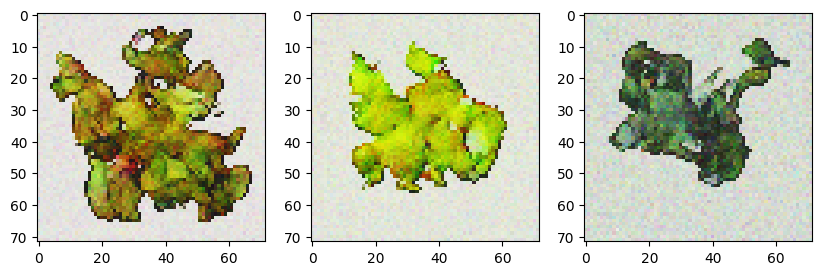

0.01892122:  46%|████▌     | 45997/100001 [25:08<28:12, 31.90it/s]  

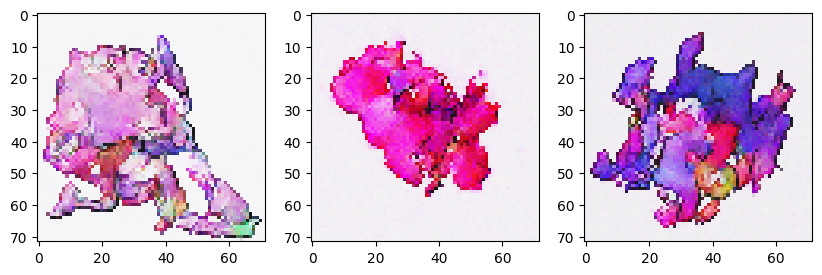

0.02693461:  47%|████▋     | 46997/100001 [25:41<27:41, 31.91it/s]  

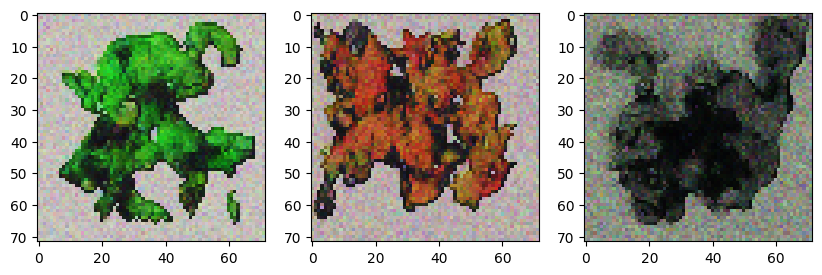

0.01382319:  48%|████▊     | 47997/100001 [26:13<27:13, 31.83it/s]  

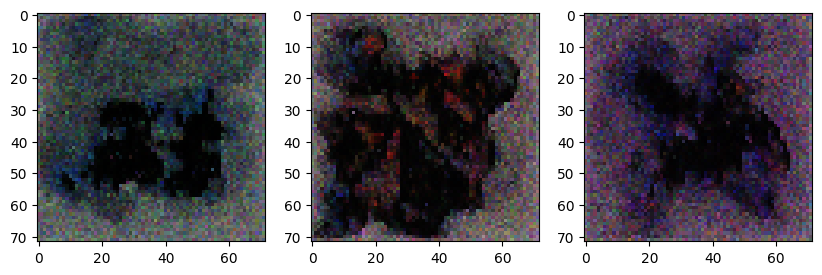

0.02166153:  49%|████▉     | 48997/100001 [26:46<26:42, 31.83it/s]  

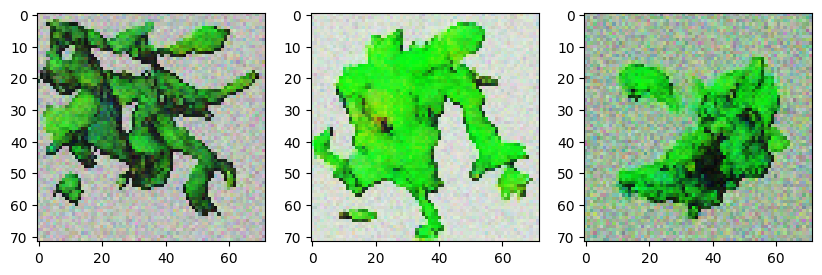

0.02416315:  50%|████▉     | 49997/100001 [27:19<26:25, 31.54it/s]  

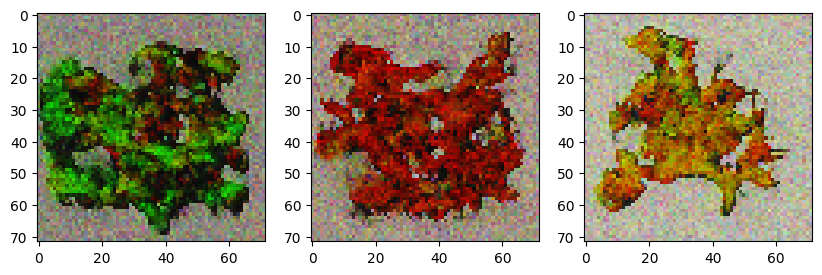

0.00923190:  51%|█████     | 50997/100001 [27:52<25:40, 31.81it/s]  

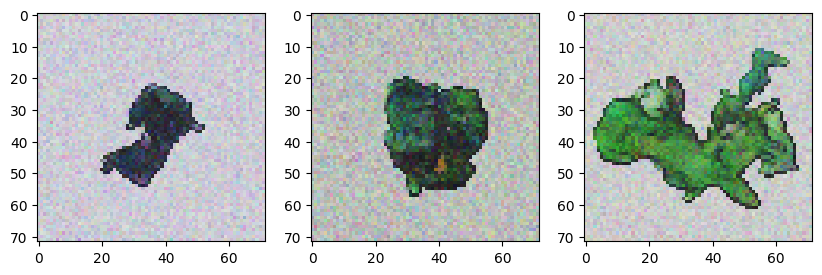

0.02424036:  52%|█████▏    | 51997/100001 [28:25<25:07, 31.84it/s]  

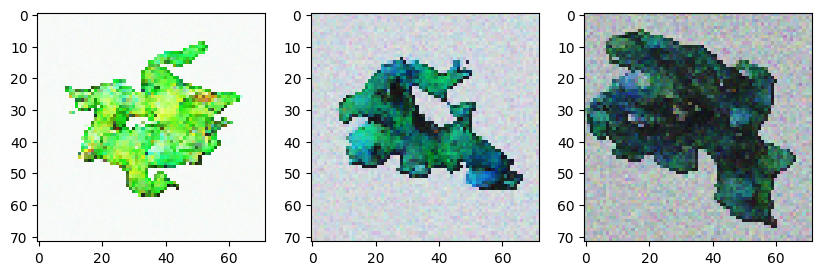

0.00900815:  53%|█████▎    | 52997/100001 [28:57<24:34, 31.89it/s]  

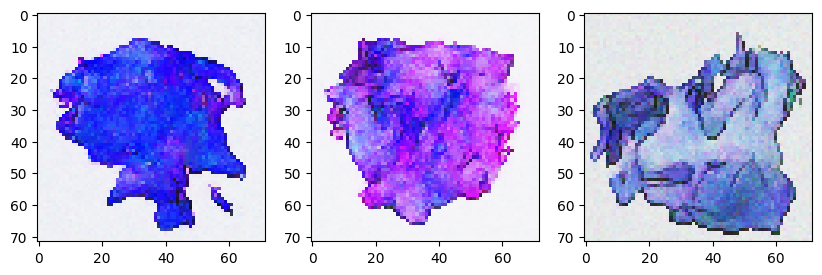

0.01538876:  54%|█████▍    | 53997/100001 [29:30<24:04, 31.86it/s]  

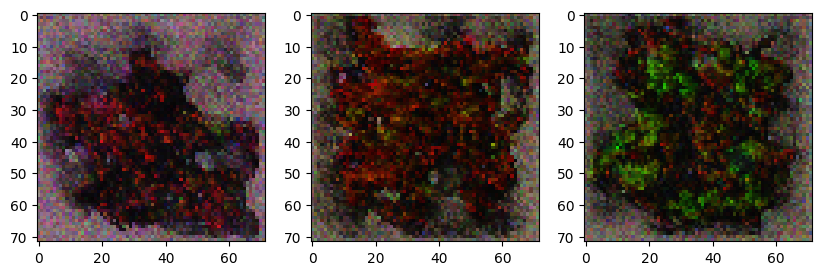

0.00833682:  55%|█████▍    | 54997/100001 [30:03<23:32, 31.85it/s]  

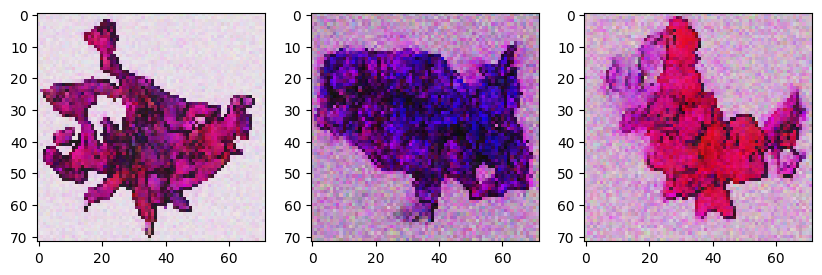

0.02963039:  56%|█████▌    | 55997/100001 [30:36<23:02, 31.83it/s]  

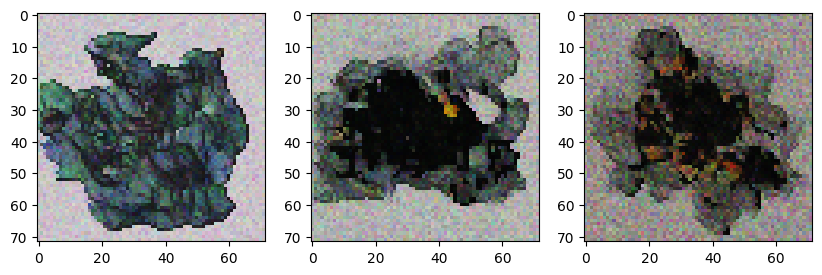

0.01408154:  57%|█████▋    | 56997/100001 [31:09<22:29, 31.87it/s]  

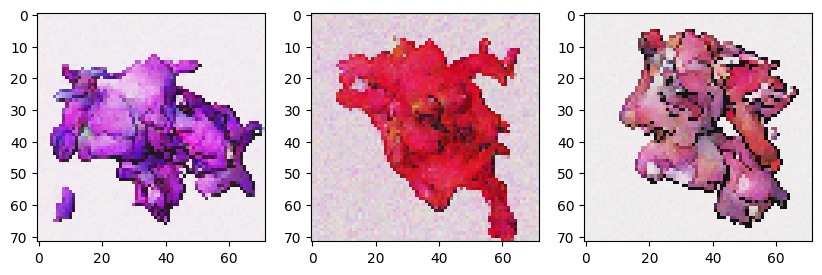

0.01454651:  58%|█████▊    | 57997/100001 [31:41<22:01, 31.79it/s]  

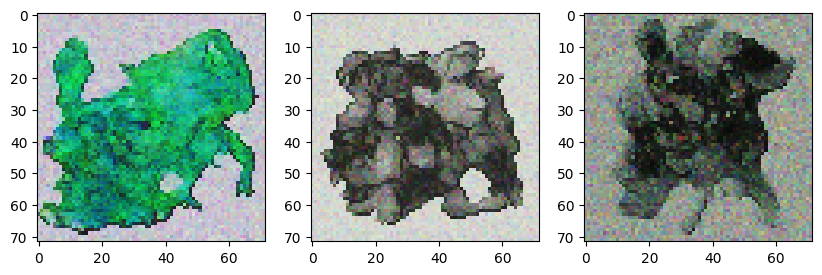

0.02013269:  59%|█████▉    | 58997/100001 [32:14<21:33, 31.69it/s]  

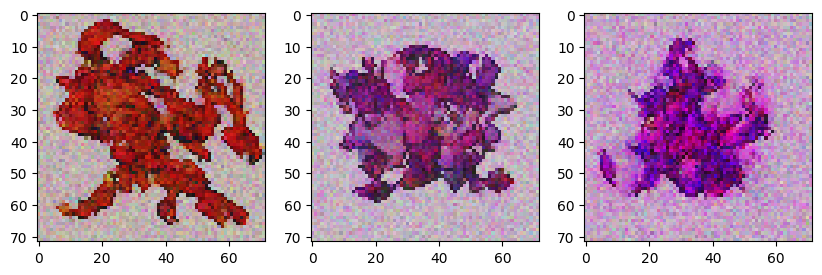

0.01546327:  60%|█████▉    | 59997/100001 [32:47<20:57, 31.80it/s]  

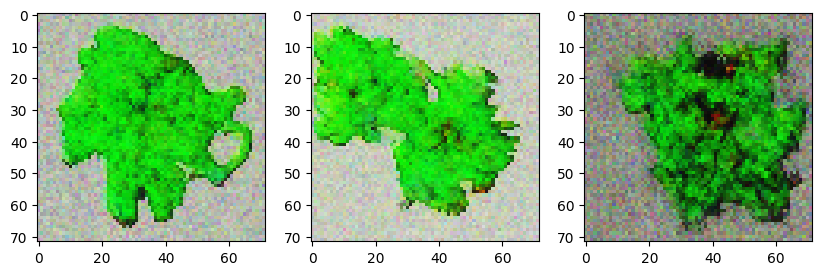

0.00634244:  61%|██████    | 60997/100001 [33:20<20:26, 31.80it/s]  

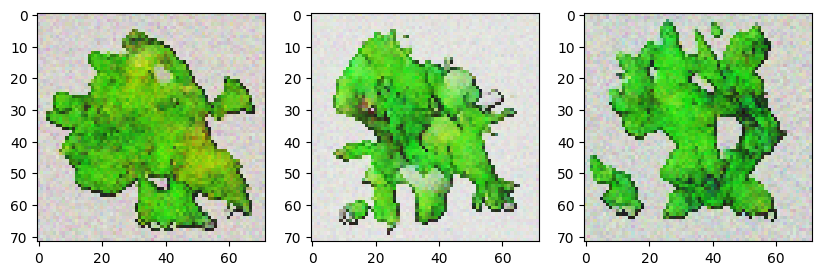

0.02881340:  62%|██████▏   | 61997/100001 [33:53<19:52, 31.88it/s]  

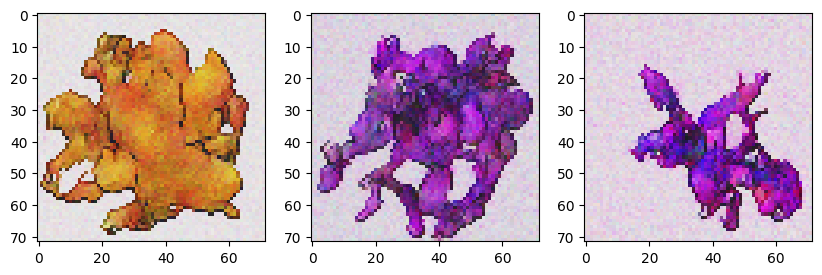

0.01562801:  63%|██████▎   | 62997/100001 [34:25<19:20, 31.88it/s]  

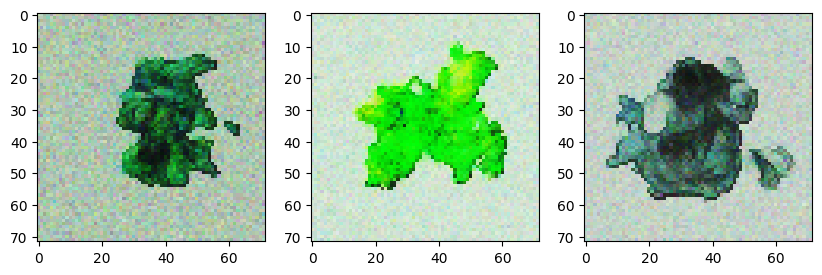

0.01383320:  64%|██████▍   | 63997/100001 [34:58<18:49, 31.88it/s]  

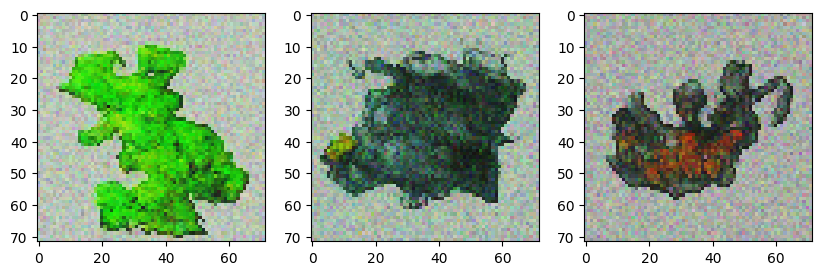

0.01598208:  65%|██████▍   | 64997/100001 [35:31<18:18, 31.86it/s]  

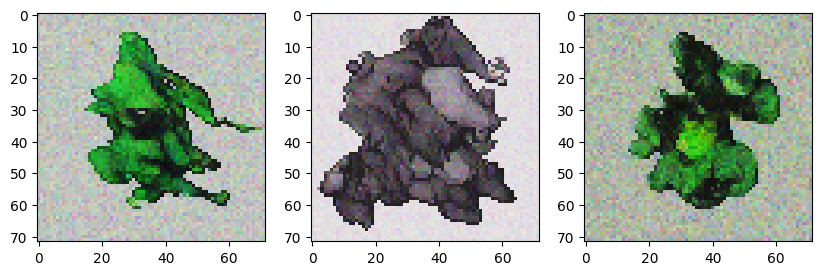

0.00700680:  66%|██████▌   | 65997/100001 [36:04<17:47, 31.87it/s]  

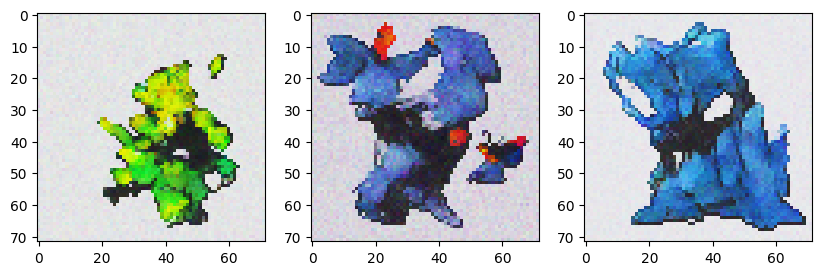

0.00968812:  67%|██████▋   | 66997/100001 [36:36<17:16, 31.85it/s]  

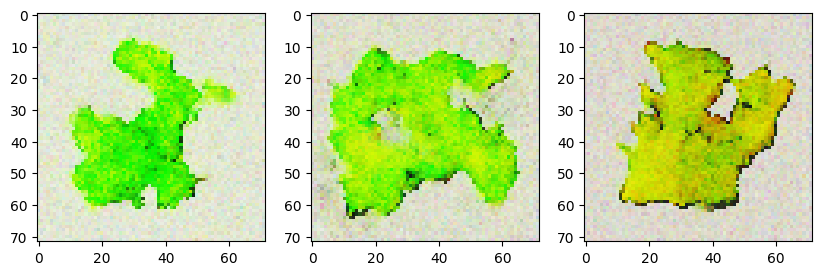

0.00810494:  68%|██████▊   | 67997/100001 [37:09<16:45, 31.81it/s]  

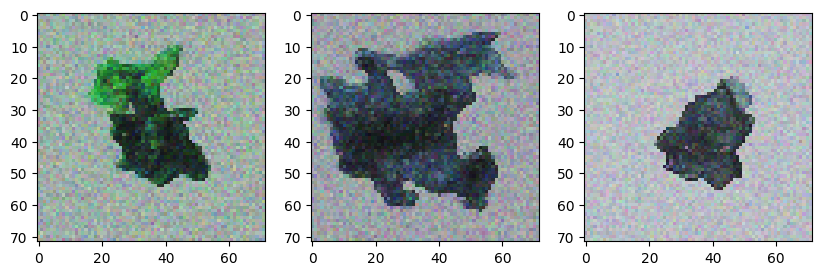

0.01303033:  69%|██████▉   | 68997/100001 [37:42<16:12, 31.89it/s]  

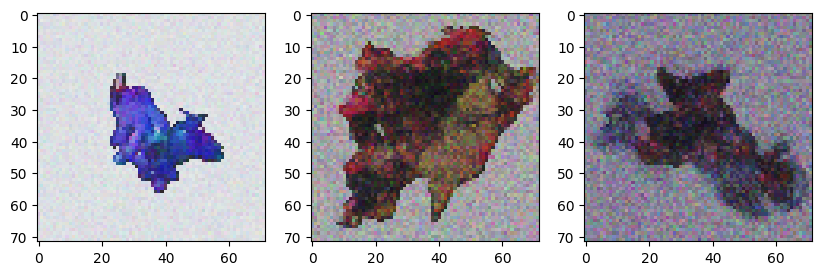

0.01081384:  70%|██████▉   | 69997/100001 [38:15<15:43, 31.82it/s]  

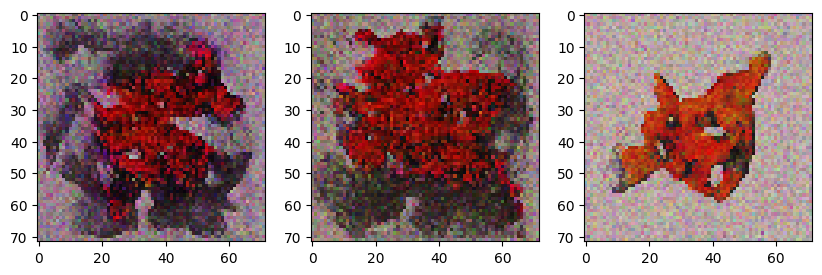

0.01231452:  71%|███████   | 70997/100001 [38:48<15:10, 31.87it/s]  

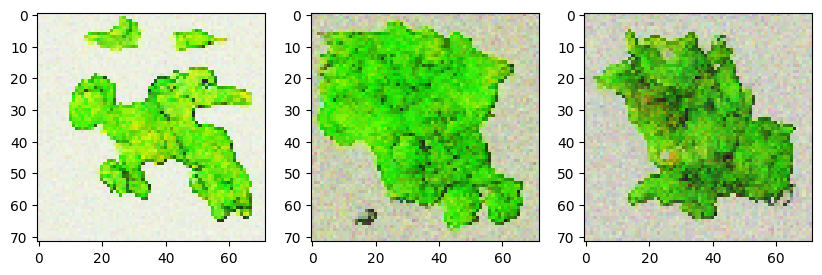

0.01947053:  72%|███████▏  | 71997/100001 [39:20<14:39, 31.84it/s]  

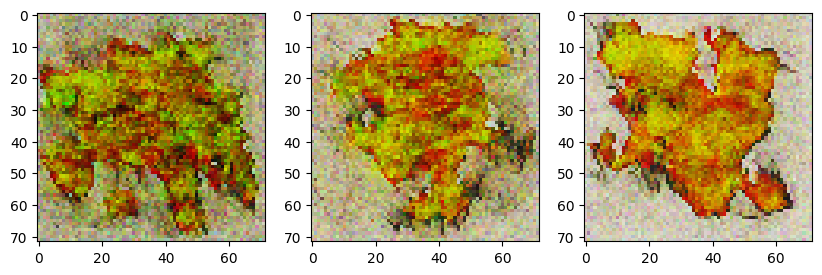

0.01586618:  73%|███████▎  | 72997/100001 [39:53<14:06, 31.88it/s]  

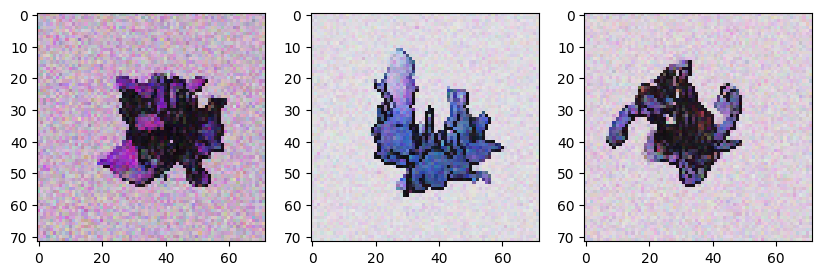

0.02288978:  74%|███████▍  | 73997/100001 [40:26<13:35, 31.87it/s]

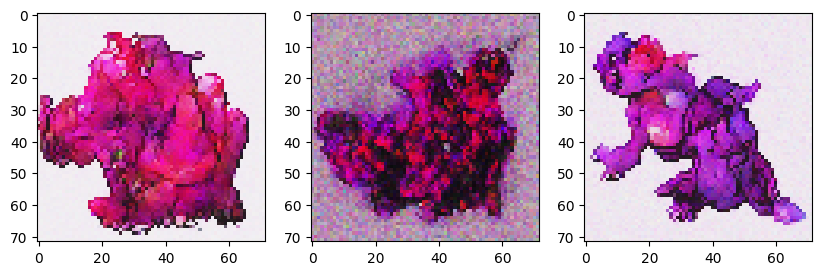

0.01606481:  75%|███████▍  | 74997/100001 [40:59<13:06, 31.77it/s]

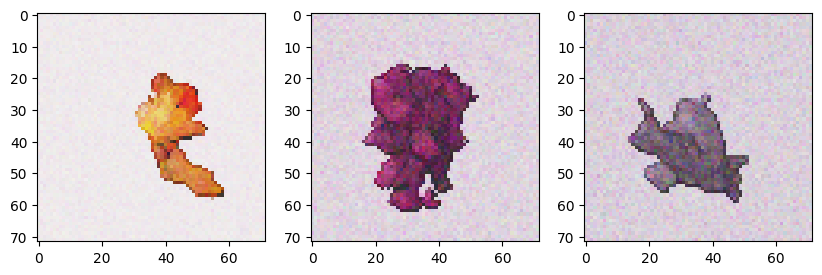

0.02859266:  76%|███████▌  | 75997/100001 [41:32<12:34, 31.81it/s]

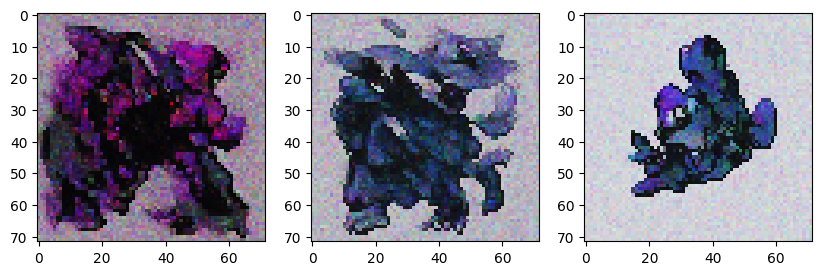

0.00782726:  77%|███████▋  | 76997/100001 [42:04<12:01, 31.90it/s]

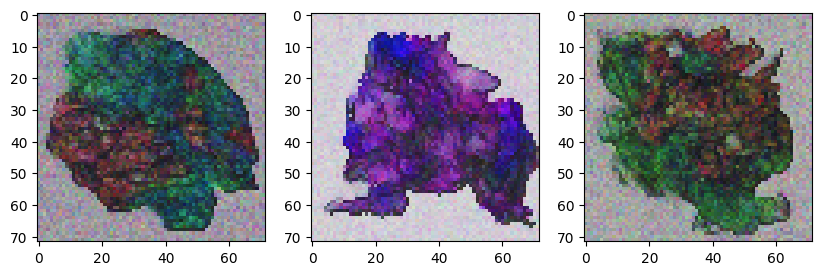

0.00971185:  78%|███████▊  | 77997/100001 [42:37<11:30, 31.87it/s]

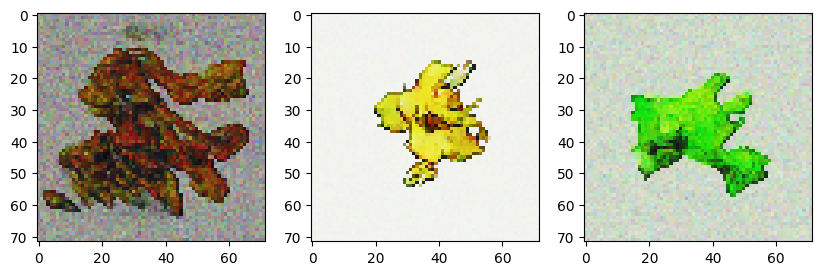

0.00847772:  79%|███████▉  | 78997/100001 [43:10<10:56, 32.00it/s]

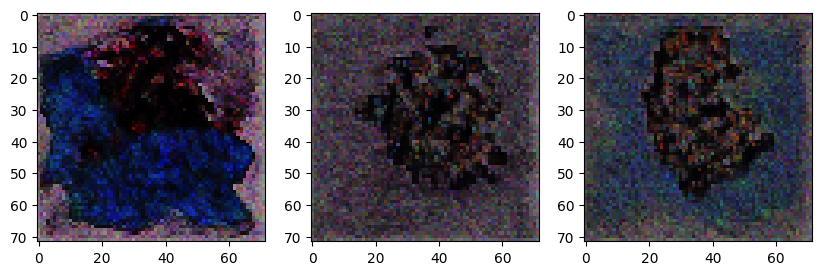

0.01605707:  80%|███████▉  | 79997/100001 [43:43<10:28, 31.85it/s]

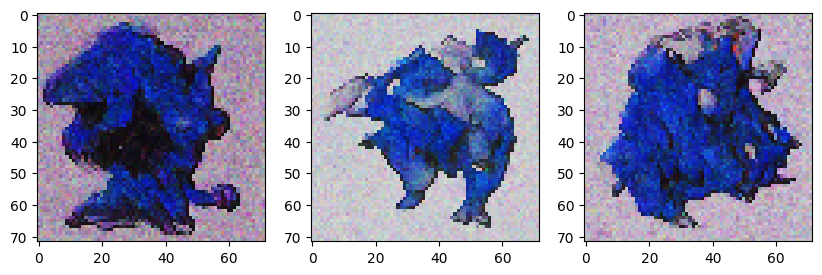

0.01082543:  81%|████████  | 81000/100001 [44:15<09:56, 31.87it/s]

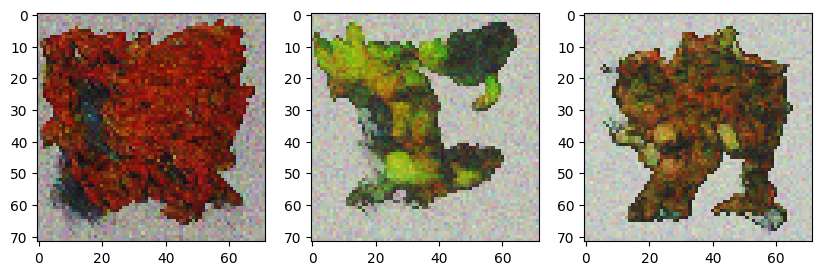

0.02209595:  82%|████████▏ | 82000/100001 [44:48<09:24, 31.88it/s]

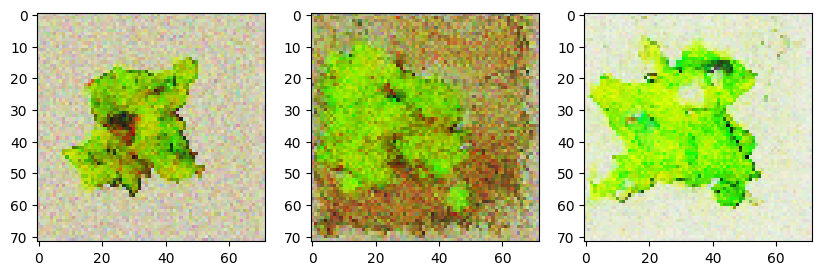

0.00932867:  83%|████████▎ | 83000/100001 [45:21<08:53, 31.88it/s]

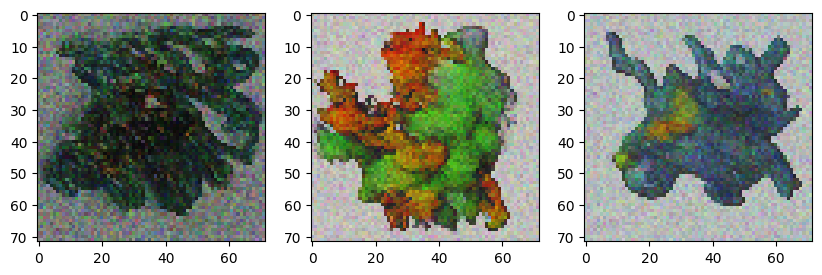

0.02574562:  84%|████████▍ | 84000/100001 [45:54<08:23, 31.76it/s]

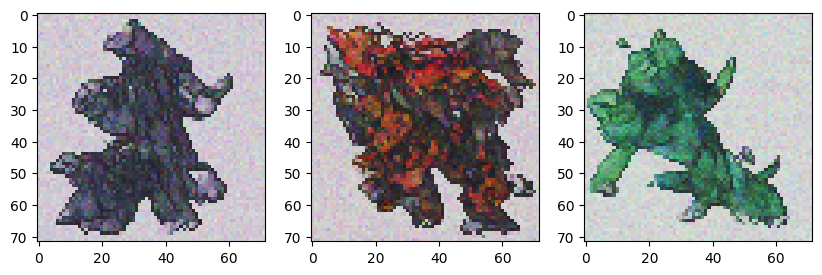

0.01792256:  85%|████████▍ | 85000/100001 [46:27<07:51, 31.83it/s]

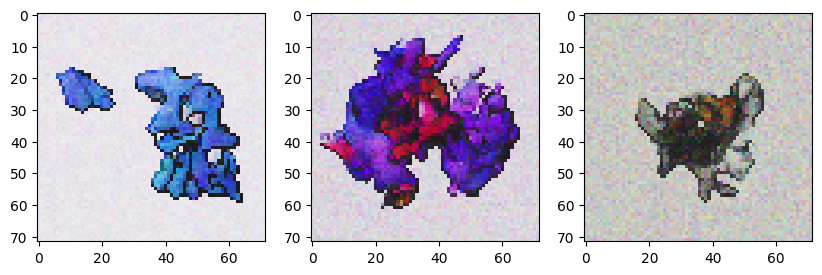

0.00860091:  86%|████████▌ | 86000/100001 [47:00<07:19, 31.88it/s]

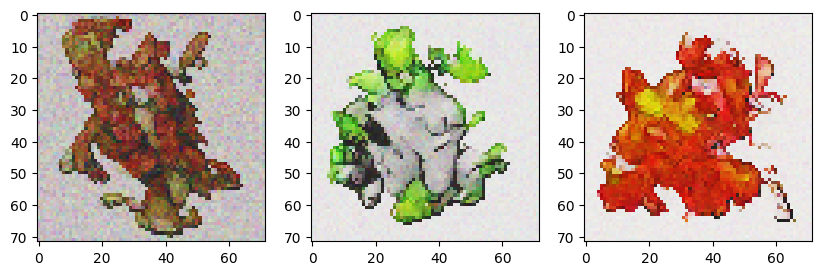

0.01947604:  87%|████████▋ | 87000/100001 [47:33<06:49, 31.75it/s]

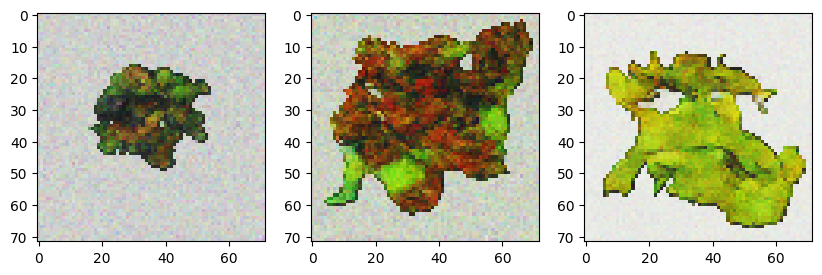

0.01129600:  88%|████████▊ | 88000/100001 [48:05<06:17, 31.78it/s]

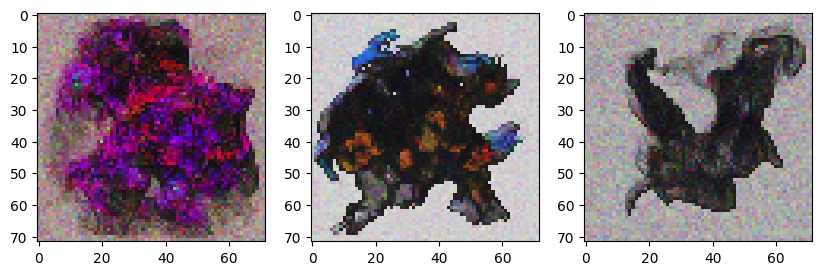

0.01140707:  89%|████████▉ | 89000/100001 [48:38<05:48, 31.53it/s]

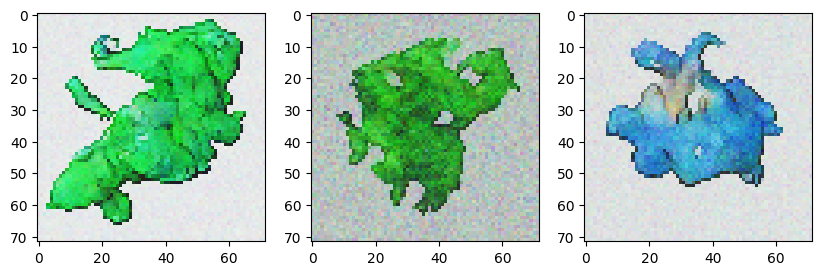

0.01137777:  90%|████████▉ | 90000/100001 [49:11<05:13, 31.86it/s]

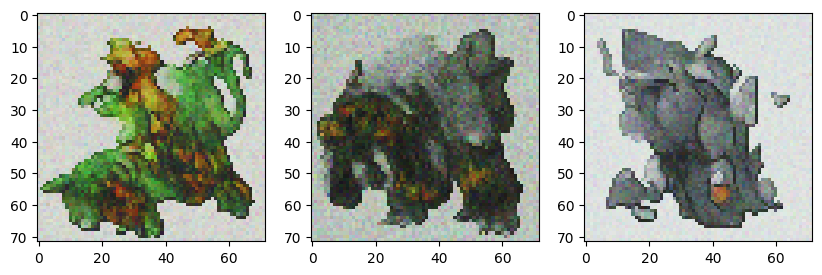

0.01333850:  91%|█████████ | 91000/100001 [49:44<04:42, 31.84it/s]

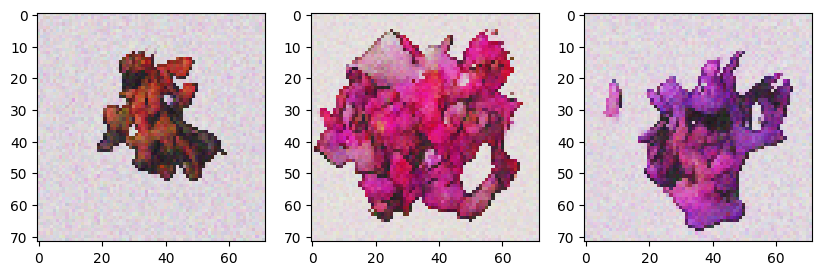

0.00837720:  92%|█████████▏| 92000/100001 [50:17<04:12, 31.74it/s]

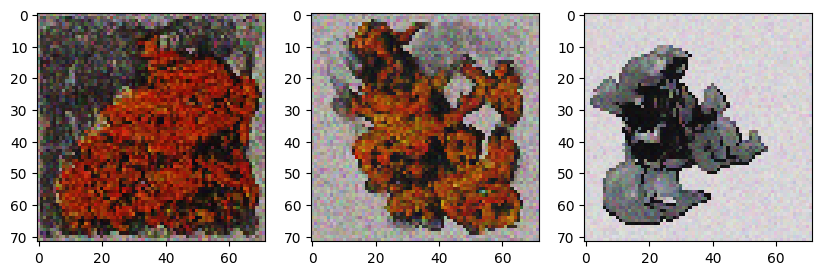

0.00853904:  93%|█████████▎| 93000/100001 [50:50<03:40, 31.78it/s]

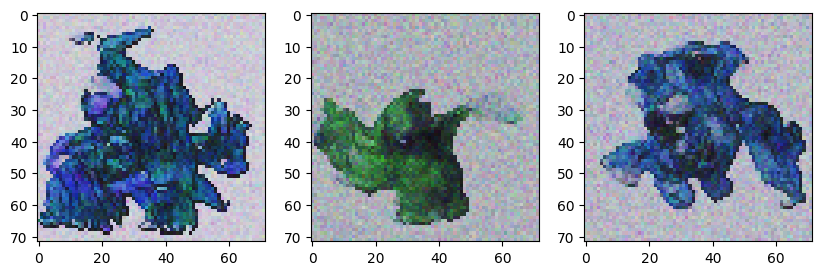

0.01267408:  94%|█████████▍| 94000/100001 [51:23<03:08, 31.88it/s]

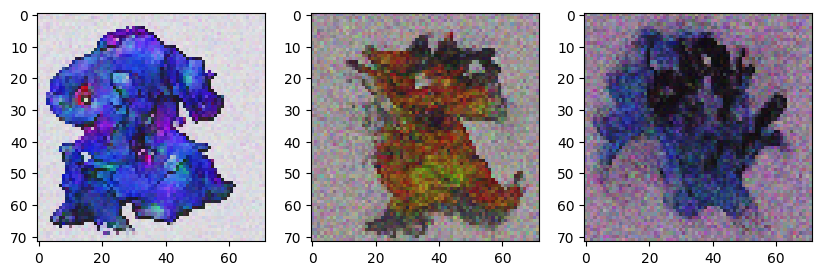

0.00397476:  95%|█████████▍| 95000/100001 [51:56<02:37, 31.85it/s]

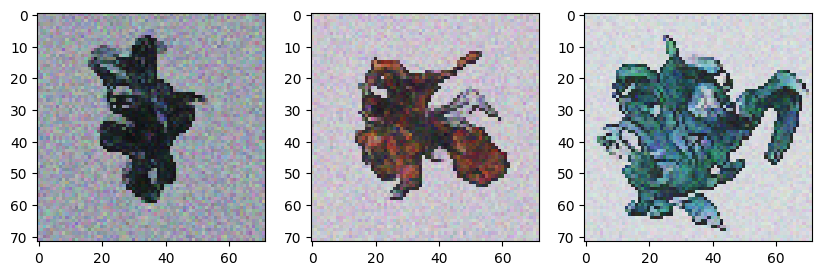

0.01001603:  96%|█████████▌| 96000/100001 [52:28<02:05, 31.83it/s]

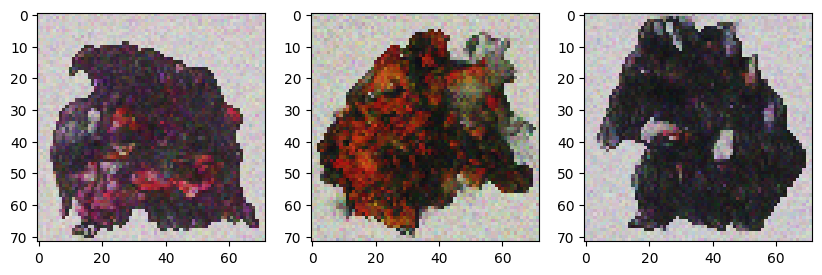

0.01661037:  97%|█████████▋| 97000/100001 [53:01<01:34, 31.86it/s]

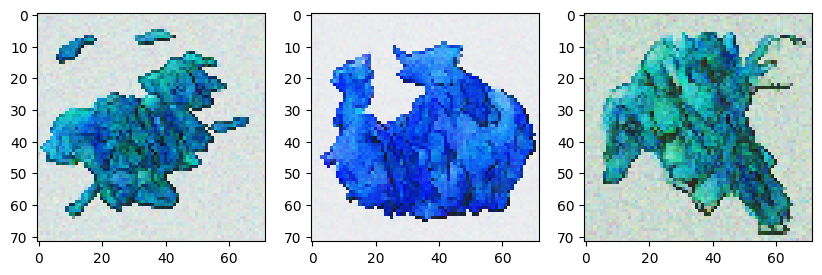

0.02053714:  98%|█████████▊| 98000/100001 [53:34<01:02, 31.79it/s]

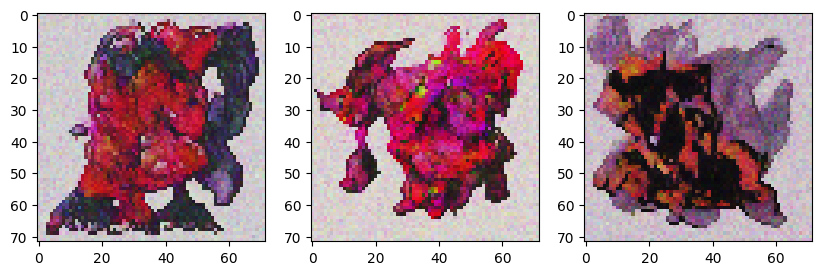

0.01341013:  99%|█████████▉| 99000/100001 [54:07<00:31, 31.89it/s]

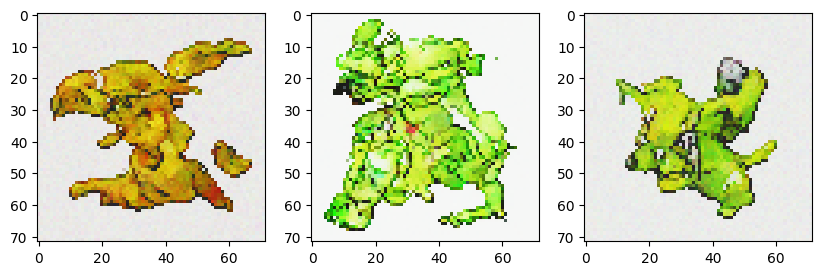

0.01521204: 100%|█████████▉| 100000/100001 [54:40<00:00, 31.92it/s]

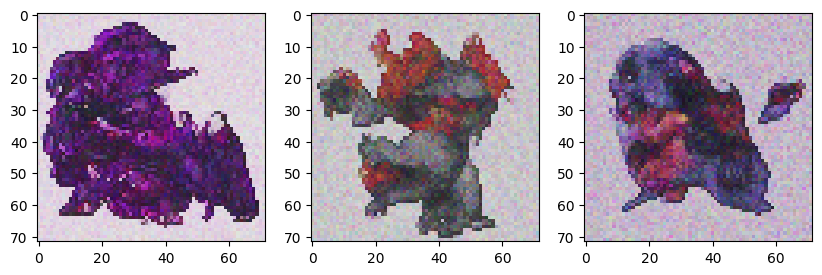

0.04799389: 100%|██████████| 100001/100001 [54:41<00:00, 30.47it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
pbar = tqdm(range(100001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    x0 = pimages[source, batch]
    x0 = torch.stack([transform(x) for x in x0], dim=0)
    x0 = isigmoid(x0)

    ty = types[batch]
    
    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 1000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')